In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns

In [2]:
sm_data = pd.read_csv("dataset/social_media_data.csv")
sm_data.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


In [3]:
print(sm_data.shape)
print(sm_data.isnull().sum())
sm_data.dropna(inplace=True, subset=["gross"])

(4916, 28)
color                         19
director_name                102
num_critic_for_reviews        49
duration                      15
director_facebook_likes      102
actor_3_facebook_likes        23
actor_2_name                  13
actor_1_facebook_likes         7
gross                        862
genres                         0
actor_1_name                   7
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  23
facenumber_in_poster          13
plot_keywords                152
movie_imdb_link                0
num_user_for_reviews          21
language                      12
country                        5
content_rating               300
budget                       484
title_year                   106
actor_2_facebook_likes        13
imdb_score                     0
aspect_ratio                 326
movie_facebook_likes           0
dtype: int64


In [4]:
print(sm_data.shape)
print(sm_data.isnull().sum())
sm_data.head()

(4054, 28)
color                          2
director_name                  2
num_critic_for_reviews         3
duration                       2
director_facebook_likes        2
actor_3_facebook_likes        13
actor_2_name                   6
actor_1_facebook_likes         4
gross                          0
genres                         0
actor_1_name                   4
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  13
facenumber_in_poster           7
plot_keywords                 40
movie_imdb_link                0
num_user_for_reviews           1
language                       3
country                        0
content_rating                63
budget                       265
title_year                     2
actor_2_facebook_likes         6
imdb_score                     0
aspect_ratio                 104
movie_facebook_likes           0
dtype: int64


,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
5,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,...,738.0,English,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000


actor-actor relation

{'CCH Pounder': 0.0028414856910899127, 'Joel David Moore': 0.0020296326364927946, 'Wes Studi': 0.0024355591637913536, 'Johnny Depp': 0.012177795818956769, 'Orlando Bloom': 0.002638522427440633, 'Jack Davenport': 0.0014207428455449563, 'Christoph Waltz': 0.0032474122183884717, 'Rory Kinnear': 0.0016237061091942358, 'Stephanie Sigman': 0.00040592652729855896, 'Tom Hardy': 0.004465191800284148, 'Christian Bale': 0.010554089709762533, 'Joseph Gordon-Levitt': 0.006900750964075502, 'Daryl Sabara': 0.0018266693728435153, 'Samantha Morton': 0.0028414856910899127, 'Polly Walker': 0.0008118530545971179, 'J.K. Simmons': 0.010554089709762533, 'James Franco': 0.008930383600568297, 'Kirsten Dunst': 0.008930383600568297, 'Brad Garrett': 0.0024355591637913536, 'Donna Murphy': 0.0008118530545971179, 'M.C. Gainey': 0.0020296326364927946, 'Chris Hemsworth': 0.004668155063933428, 'Robert Downey Jr.': 0.009742236655165415, 'Scarlett Johansson': 0.009539273391516136, 'Alan Rickman': 0.0036533387456870307, '

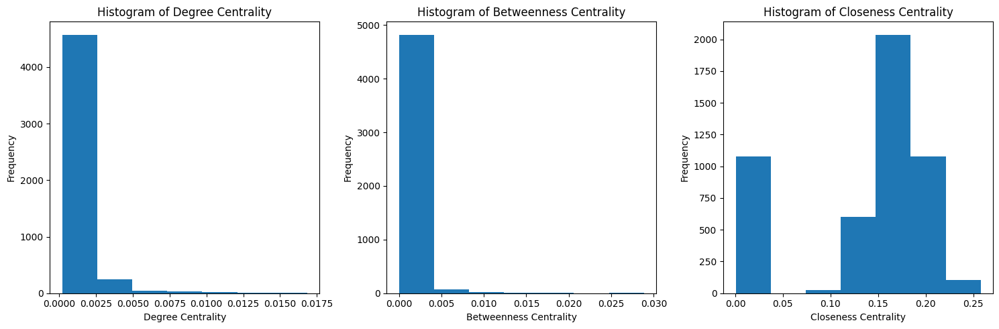

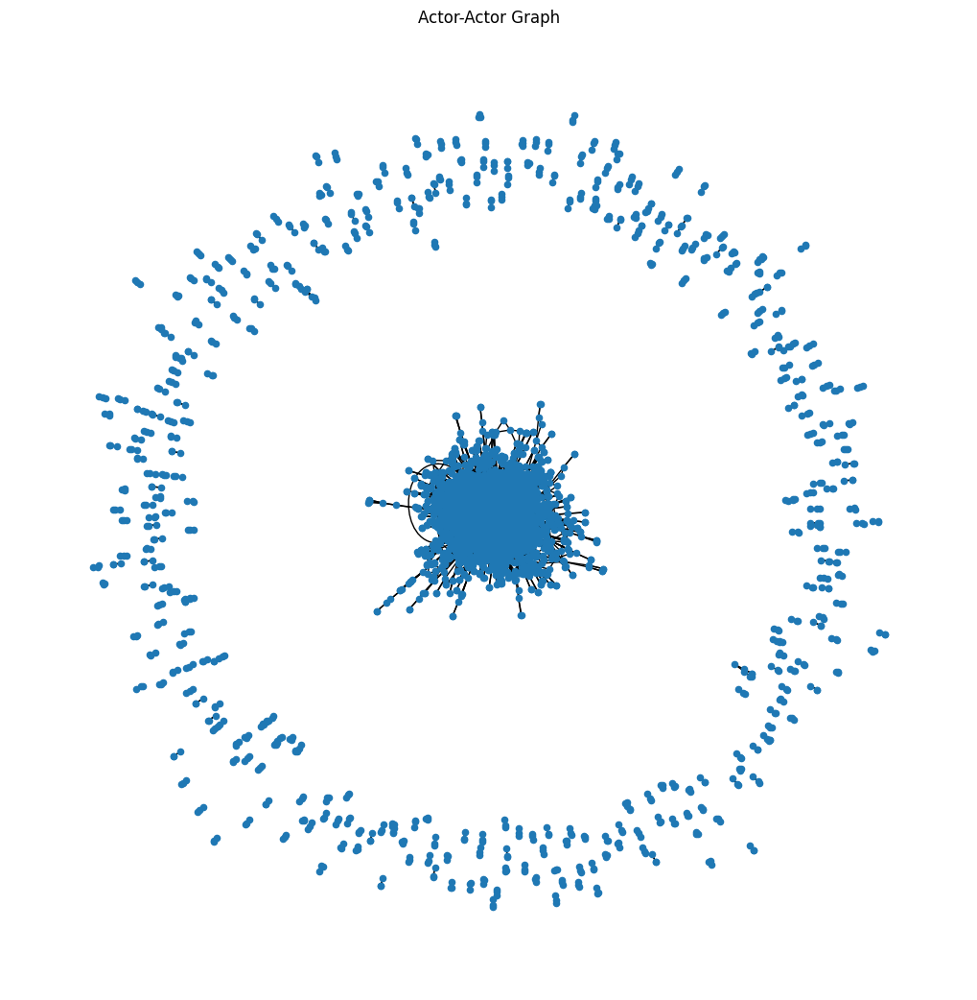

In [5]:
# Create an empty graph
G = nx.Graph()

# Iterate over each movie
for _, movie in sm_data.iterrows():
    # Get the three actors for the movie
    actors = [movie['actor_1_name'], movie['actor_2_name'], movie['actor_3_name']]
    # Add edges between all pairs of actors in the movie
    G.add_edges_from([(actor1, actor2) for i, actor1 in enumerate(actors) for actor2 in actors[i+1:]])

# Compute degree centrality, betweenness centrality, and closeness centrality
degree_centrality = nx.degree_centrality(G)
print(degree_centrality)
betweenness_centrality = nx.betweenness_centrality(G)
print(betweenness_centrality)
closeness_centrality = nx.closeness_centrality(G)
print(closeness_centrality)

# Create histograms
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(list(degree_centrality.values()), bins=7)
plt.title('Histogram of Degree Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(list(betweenness_centrality.values()), bins=7)
plt.title('Histogram of Betweenness Centrality')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(list(closeness_centrality.values()), bins=7)
plt.title('Histogram of Closeness Centrality')
plt.xlabel('Closeness Centrality')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Draw the actor-actor graph
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G)  # Positions for all nodes
nx.draw(G, pos, node_size=20, with_labels=False)
plt.title('Actor-Actor Graph')
plt.show()


In [6]:
# adding degree centrality as a column for each actor
sm_data['actor_1_degree_centrality'] = sm_data['actor_1_name'].map(degree_centrality)
sm_data['actor_2_degree_centrality'] = sm_data['actor_2_name'].map(degree_centrality)
sm_data['actor_3_degree_centrality'] = sm_data['actor_3_name'].map(degree_centrality)

# adding betweenness centrality as a column for each actor
sm_data['actor_1_betweenness_centrality'] = sm_data['actor_1_name'].map(betweenness_centrality)
sm_data['actor_2_betweenness_centrality'] = sm_data['actor_2_name'].map(betweenness_centrality)
sm_data['actor_3_betweenness_centrality'] = sm_data['actor_3_name'].map(betweenness_centrality)

# adding closeness centrality as a column for each actor
sm_data['actor_1_closeness_centrality'] = sm_data['actor_1_name'].map(closeness_centrality)
sm_data['actor_2_closeness_centrality'] = sm_data['actor_2_name'].map(closeness_centrality)
sm_data['actor_3_closeness_centrality'] = sm_data['actor_3_name'].map(closeness_centrality)

actor-movie relation

{'James Cameron': {'imdb_ratings': [7.9, 7.7, 8.5, 7.2, 7.6, 8.4, 8.1], 'average_rating': 7.914285714285714}, 'Gore Verbinski': {'imdb_ratings': [7.1, 7.3, 6.5, 7.2, 8.1, 6.1, 6.6], 'average_rating': 6.985714285714286}, 'Sam Mendes': {'imdb_ratings': [6.8, 7.8, 7.7, 7.1, 7.3, 7.1, 8.4], 'average_rating': 7.457142857142856}, 'Christopher Nolan': {'imdb_ratings': [8.5, 9.0, 8.6, 8.8, 8.3, 7.2, 8.5, 8.5], 'average_rating': 8.425}, 'Andrew Stanton': {'imdb_ratings': [6.6, 8.4, 8.2], 'average_rating': 7.733333333333333}, 'Sam Raimi': {'imdb_ratings': [6.2, 7.3, 6.4, 7.3, 6.5, 6.4, 6.6, 7.5, 7.6, 7.8], 'average_rating': 6.960000000000001}, 'Nathan Greno': {'imdb_ratings': [7.8], 'average_rating': 7.8}, 'Joss Whedon': {'imdb_ratings': [7.5, 8.1, 8.0], 'average_rating': 7.866666666666667}, 'David Yates': {'imdb_ratings': [7.5, 6.6, 7.5], 'average_rating': 7.2}, 'Zack Snyder': {'imdb_ratings': [6.9, 7.2, 7.7, 7.0, 6.1, 7.7, 7.4], 'average_rating': 7.142857142857143}, 'Bryan Singer': {'imdb_rati

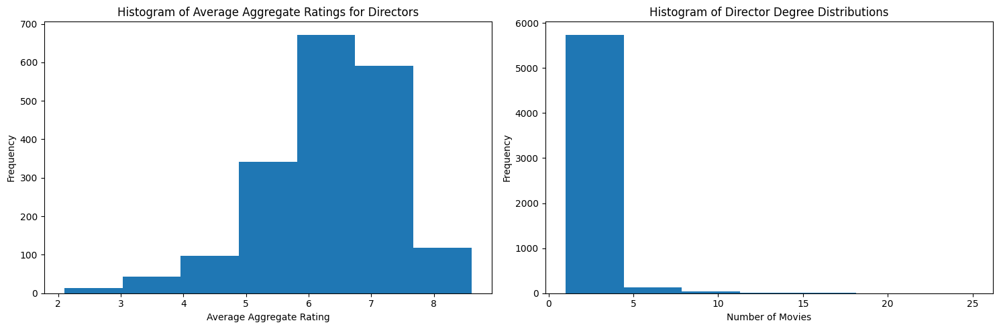

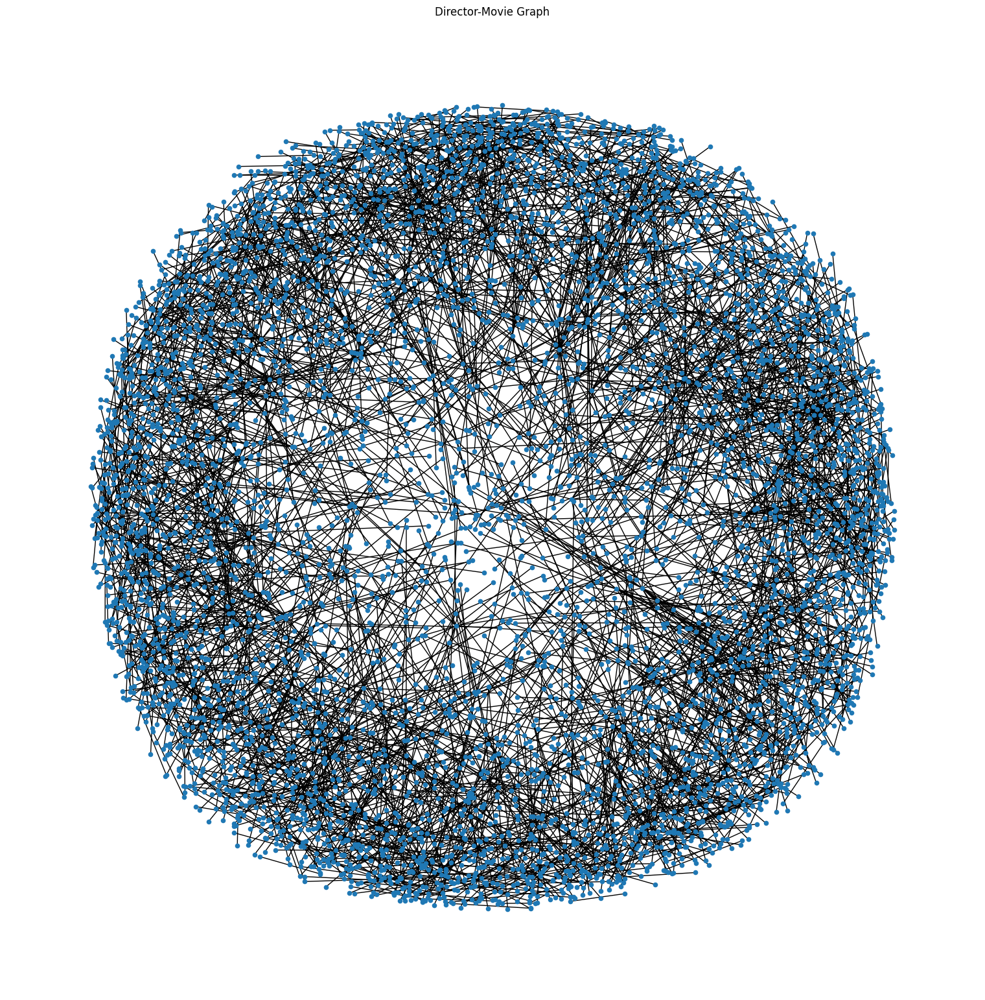

In [8]:
# Create an empty graph
G_director_movie = nx.Graph()

# Create a dictionary to store aggregate ratings for each director
director_ratings = {}

# Iterate over each movie
for _, movie in sm_data.iterrows():
    # Get the director of the movie
    director = movie['director_name']
    # Add nodes for directors
    if director not in G_director_movie.nodes:
        G_director_movie.add_node(director)
        director_ratings[director] = {'imdb_ratings': []}
    # Add edges between directors and the movie
    G_director_movie.add_edge(director, movie['movie_title'])
    # Store IMDb ratings for each director
    director_ratings[director]['imdb_ratings'].append(movie['imdb_score'])

# Calculate average aggregate ratings for each director
for director in director_ratings:
    imdb_avg = sum(director_ratings[director]['imdb_ratings']) / len(director_ratings[director]['imdb_ratings'])
    director_ratings[director]['average_rating'] = imdb_avg
print(director_ratings)
# Compute director degree distributions
director_degrees = dict(G_director_movie.degree())
print(director_degrees)

# Create histograms
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist([director_ratings[director]['average_rating'] for director in director_ratings], bins=7)
plt.title('Histogram of Average Aggregate Ratings for Directors')
plt.xlabel('Average Aggregate Rating')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(list(director_degrees.values()), bins=7)
plt.title('Histogram of Director Degree Distributions')
plt.xlabel('Number of Movies')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Draw the director-movie graph
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G_director_movie, k=0.1)  # Positions for all nodes
nx.draw(G_director_movie, pos, node_size=20, with_labels=False)
plt.title('Director-Movie Graph')
plt.show()


In [11]:
# Create a dictionary with director names as keys and their average ratings as values
director_avg_ratings = {director: director_ratings[director]['average_rating'] for director in director_ratings}

# Map the dictionary to a new column in your dataframe
sm_data['director_avg_rating'] = sm_data['director_name'].map(director_avg_ratings)

# Display the dataframe
print(sm_data.head())

   color      director_name  num_critic_for_reviews  duration  \
0  Color      James Cameron                   723.0     178.0   
1  Color     Gore Verbinski                   302.0     169.0   
2  Color         Sam Mendes                   602.0     148.0   
3  Color  Christopher Nolan                   813.0     164.0   
5  Color     Andrew Stanton                   462.0     132.0   

   director_facebook_likes  actor_3_facebook_likes      actor_2_name  \
0                      0.0                   855.0  Joel David Moore   
1                    563.0                  1000.0     Orlando Bloom   
2                      0.0                   161.0      Rory Kinnear   
3                  22000.0                 23000.0    Christian Bale   
5                    475.0                   530.0   Samantha Morton   

   actor_1_facebook_likes        gross                           genres  ...  \
0                  1000.0  760505847.0  Action|Adventure|Fantasy|Sci-Fi  ...   
1               

{'CCH Pounder': {'imdb_ratings': [7.9, 5.7, 7.3, 6.0, 3.9, 7.0, 6.7], 'average_rating': 6.357142857142857}, 'Joel David Moore': {'imdb_ratings': [7.9, 4.4, 6.7, 4.0, 7.0], 'average_rating': 6.0}, 'Wes Studi': {'imdb_ratings': [7.9, 6.0, 6.0, 7.8, 6.7, 6.1], 'average_rating': 6.75}, 'Johnny Depp': {'imdb_ratings': [7.1, 7.3, 6.5, 6.7, 6.5, 6.4, 6.7, 6.2, 7.2, 8.1, 7.0, 6.0, 6.3, 5.5, 7.0, 6.0, 6.8, 6.6, 6.7, 7.5, 7.8, 5.3, 7.6, 7.4, 6.4, 7.8, 6.8, 6.4, 7.9, 7.7, 7.9, 7.8, 8.1, 4.9, 5.4], 'average_rating': 6.837142857142859}, 'Orlando Bloom': {'imdb_ratings': [7.1, 7.3, 7.2, 8.1, 8.8, 7.2, 8.9, 8.7, 5.8, 6.4], 'average_rating': 7.55}, 'Jack Davenport': {'imdb_ratings': [7.1, 7.3, 8.1, 7.3, 6.4, 6.1], 'average_rating': 7.050000000000001}, 'Christoph Waltz': {'imdb_ratings': [6.8, 6.6, 5.8, 8.5, 8.3, 6.3, 6.9, 7.0], 'average_rating': 7.0249999999999995}, 'Rory Kinnear': {'imdb_ratings': [6.8, 6.7, 7.8, 8.1], 'average_rating': 7.35}, 'Stephanie Sigman': {'imdb_ratings': [6.8], 'average_rati

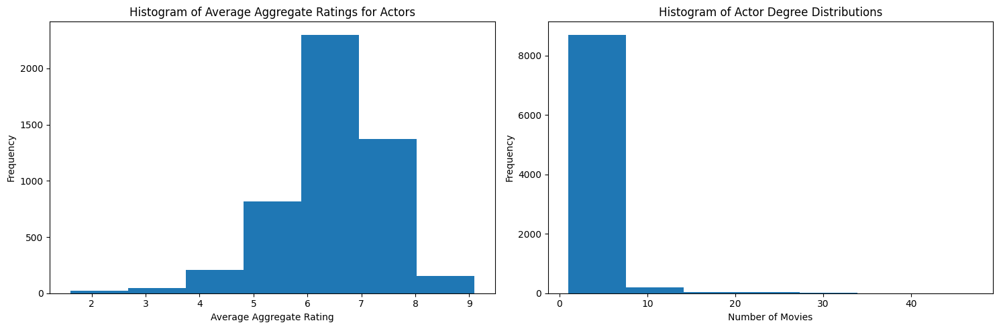

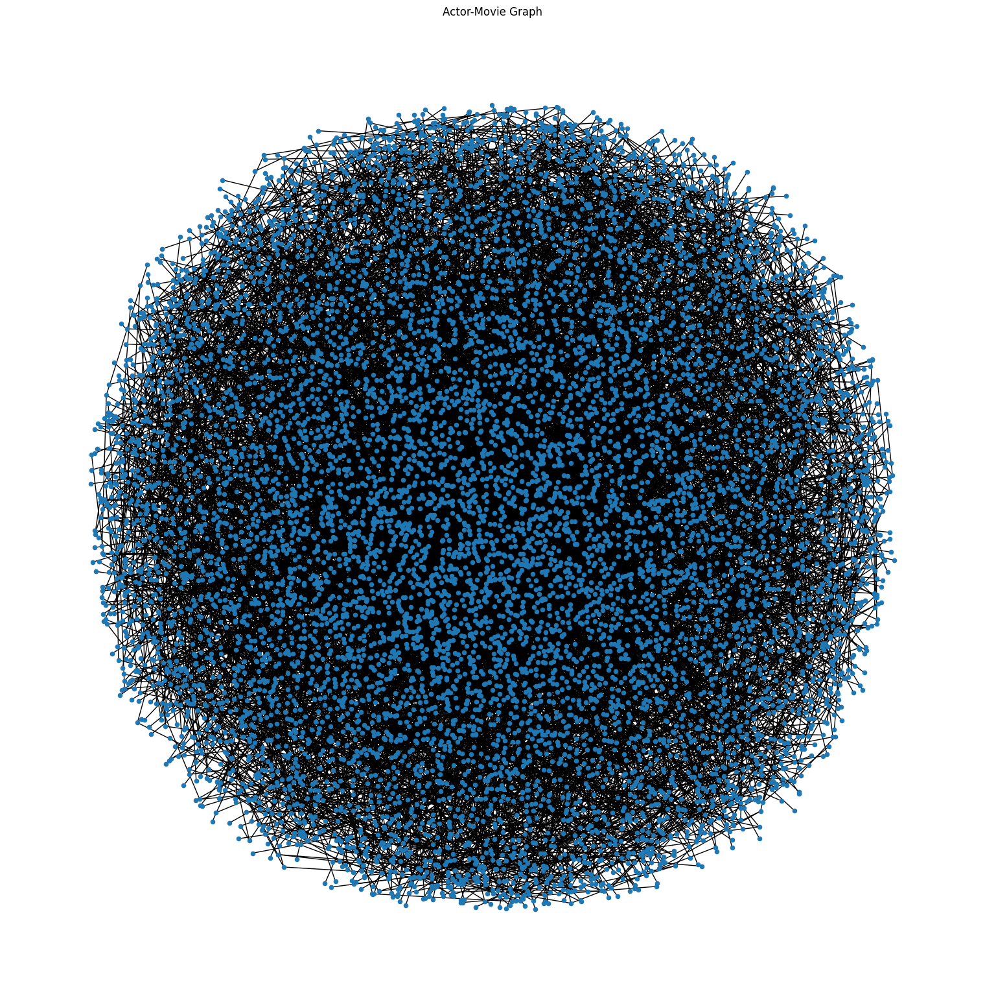

In [10]:
# Create an empty graph
G_actor_movie = nx.Graph()

# Create a dictionary to store aggregate ratings for each actor
actor_ratings = {}

# Iterate over each movie
for _, movie in sm_data.iterrows():
    # Get the three actors for the movie
    actors = [movie['actor_1_name'], movie['actor_2_name'], movie['actor_3_name']]
    # Add nodes for actors
    for actor in actors:
        if actor not in G_actor_movie.nodes:
            G_actor_movie.add_node(actor)
            actor_ratings[actor] = {'imdb_ratings': []}
    # Add edges between actors and the movie
    for actor in actors:
        if actor in actor_ratings:
            G_actor_movie.add_edge(actor, movie['movie_title'])
            # Store IMDb ratings for each actor
            actor_ratings[actor]['imdb_ratings'].append(movie['imdb_score'])

# Calculate average aggregate ratings for each actor
for actor in actor_ratings:
    imdb_avg = sum(actor_ratings[actor]['imdb_ratings']) / len(actor_ratings[actor]['imdb_ratings'])
    actor_ratings[actor]['average_rating'] = imdb_avg

print(actor_ratings)
# Compute actor degree distributions
actor_degrees = dict(G_actor_movie.degree())
print(actor_degrees)

# Create histograms
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist([actor_ratings[actor]['average_rating'] for actor in actor_ratings], bins=7)
plt.title('Histogram of Average Aggregate Ratings for Actors')
plt.xlabel('Average Aggregate Rating')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(list(actor_degrees.values()), bins=7)
plt.title('Histogram of Actor Degree Distributions')
plt.xlabel('Number of Movies')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Draw the actor-movie graph
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G_actor_movie, k=0.1)  # Positions for all nodes
nx.draw(G_actor_movie, pos, node_size=20, with_labels=False)
plt.title('Actor-Movie Graph')
plt.show()

In [13]:
print(actor_ratings)

{'CCH Pounder': {'imdb_ratings': [7.9, 5.7, 7.3, 6.0, 3.9, 7.0, 6.7], 'average_rating': 6.357142857142857}, 'Joel David Moore': {'imdb_ratings': [7.9, 4.4, 6.7, 4.0, 7.0], 'average_rating': 6.0}, 'Wes Studi': {'imdb_ratings': [7.9, 6.0, 6.0, 7.8, 6.7, 6.1], 'average_rating': 6.75}, 'Johnny Depp': {'imdb_ratings': [7.1, 7.3, 6.5, 6.7, 6.5, 6.4, 6.7, 6.2, 7.2, 8.1, 7.0, 6.0, 6.3, 5.5, 7.0, 6.0, 6.8, 6.6, 6.7, 7.5, 7.8, 5.3, 7.6, 7.4, 6.4, 7.8, 6.8, 6.4, 7.9, 7.7, 7.9, 7.8, 8.1, 4.9, 5.4], 'average_rating': 6.837142857142859}, 'Orlando Bloom': {'imdb_ratings': [7.1, 7.3, 7.2, 8.1, 8.8, 7.2, 8.9, 8.7, 5.8, 6.4], 'average_rating': 7.55}, 'Jack Davenport': {'imdb_ratings': [7.1, 7.3, 8.1, 7.3, 6.4, 6.1], 'average_rating': 7.050000000000001}, 'Christoph Waltz': {'imdb_ratings': [6.8, 6.6, 5.8, 8.5, 8.3, 6.3, 6.9, 7.0], 'average_rating': 7.0249999999999995}, 'Rory Kinnear': {'imdb_ratings': [6.8, 6.7, 7.8, 8.1], 'average_rating': 7.35}, 'Stephanie Sigman': {'imdb_ratings': [6.8], 'average_rati

In [14]:
# Create a dictionary with director names as keys and their average ratings as values
actor_avg_ratings = {actor: actor_ratings[actor]['average_rating'] for actor in actor_ratings}

# Map the dictionary to a new column in your dataframe
sm_data['actor_1_avg_rating'] = sm_data['actor_1_name'].map(actor_avg_ratings)
sm_data['actor_2_avg_rating'] = sm_data['actor_2_name'].map(actor_avg_ratings)
sm_data['actor_3_avg_rating'] = sm_data['actor_3_name'].map(actor_avg_ratings)

# Display the dataframe
print(sm_data.head())

   color      director_name  num_critic_for_reviews  duration  \
0  Color      James Cameron                   723.0     178.0   
1  Color     Gore Verbinski                   302.0     169.0   
2  Color         Sam Mendes                   602.0     148.0   
3  Color  Christopher Nolan                   813.0     164.0   
5  Color     Andrew Stanton                   462.0     132.0   

   director_facebook_likes  actor_3_facebook_likes      actor_2_name  \
0                      0.0                   855.0  Joel David Moore   
1                    563.0                  1000.0     Orlando Bloom   
2                      0.0                   161.0      Rory Kinnear   
3                  22000.0                 23000.0    Christian Bale   
5                    475.0                   530.0   Samantha Morton   

   actor_1_facebook_likes        gross                           genres  ...  \
0                  1000.0  760505847.0  Action|Adventure|Fantasy|Sci-Fi  ...   
1               

In [15]:
# Add a new column for each actor to store their degree
sm_data['actor_1_degree'] = sm_data['actor_1_name'].map(actor_degrees)
sm_data['actor_2_degree'] = sm_data['actor_2_name'].map(actor_degrees)
sm_data['actor_3_degree'] = sm_data['actor_3_name'].map(actor_degrees)

movie-movie relation

{2009.0: 12, 2007.0: 12, 2012.0: 11, 2010.0: 12, 2006.0: 12, 2008.0: 12, 2013.0: 10, 2011.0: 12, 2014.0: 9, 2005.0: 12, 2004.0: 12, 2003.0: 12, 2002.0: 12, 2015.0: 8, 2016.0: 7, 2001.0: 12, 2000.0: 12, 1997.0: 12, 1999.0: 12, 1995.0: 12, 1998.0: 12, 1994.0: 12, 1996.0: 12, 1993.0: 12, 1992.0: 12, 1990.0: 12, 1991.0: 12, 1989.0: 12, 1988.0: 12, 1985.0: 12, 1987.0: 12, 1986.0: 12, 1982.0: 12, 1978.0: 12, 1980.0: 12, 1984.0: 12, 1983.0: 12, 1979.0: 12, 1981.0: 12, 1977.0: 12, 1973.0: 12, 1974.0: 12, 1975.0: 12, 1976.0: 12, 1940.0: 7, 1939.0: 7, 1936.0: 5, 1937.0: 6, 1942.0: 5, 1935.0: 5, 1963.0: 11, 1960.0: 7, 1965.0: 12, 1964.0: 12, 1962.0: 11, 1968.0: 12, 1967.0: 10, 1961.0: 8, 1959.0: 7, 1966.0: 10, 1970.0: 12, 1971.0: 12, 1969.0: 12, 1972.0: 12, 1957.0: 7, 1927.0: 1, 1929.0: 4, 1946.0: 6, 1950.0: 6, 1948.0: 5, 1947.0: 5, 1953.0: 7, 1952.0: 6, 1954.0: 7, 1933.0: 4}


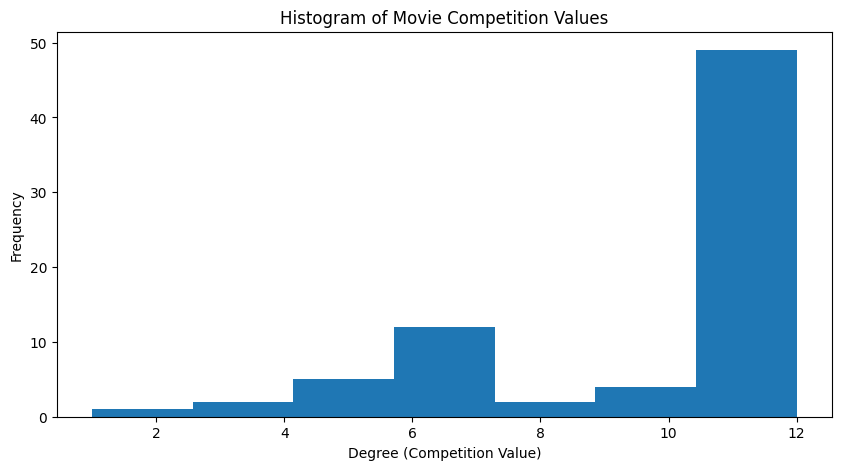

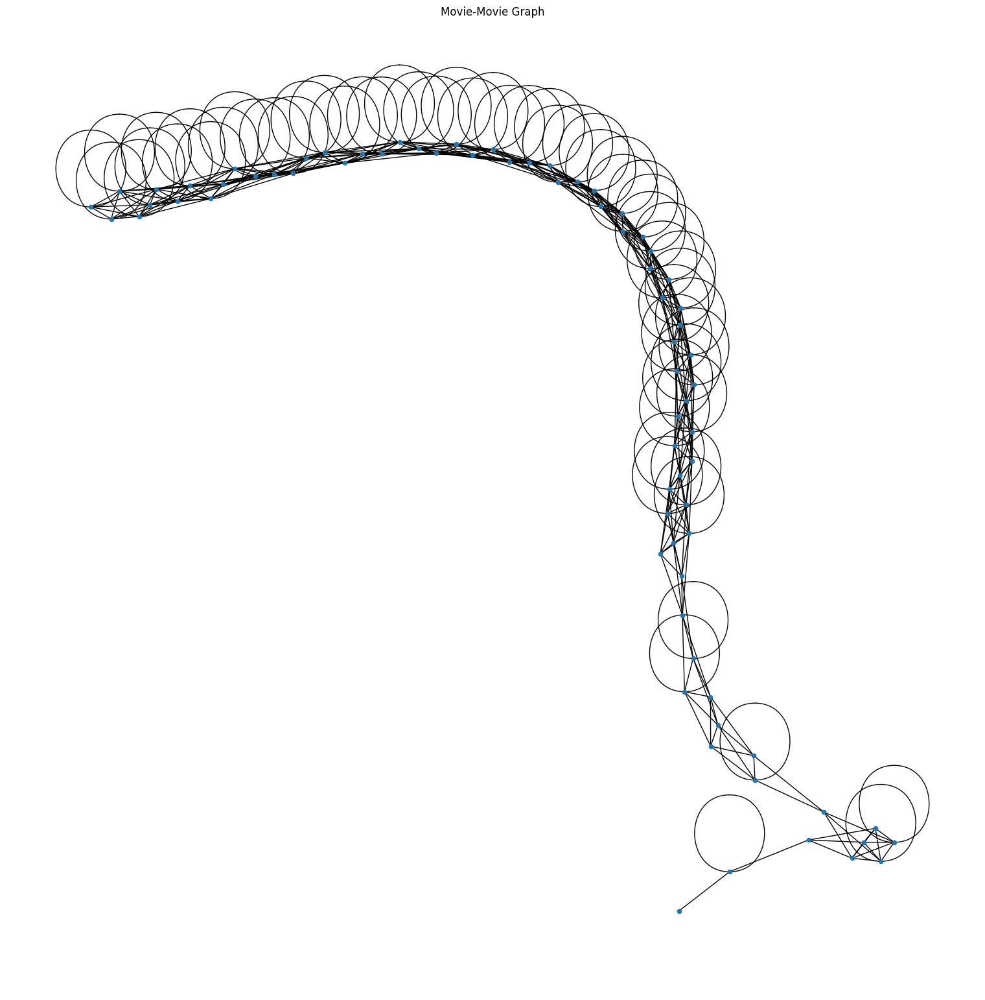

In [16]:
# Create an empty graph
G_movie_movie = nx.Graph()

# Iterate over each movie
for _, movie1 in sm_data.iterrows():
    for _, movie2 in sm_data.iterrows():
        if movie1['movie_title'] != movie2['movie_title']:
            # Check if the movies were released within a similar timeframe
            if abs(movie1['title_year'] - movie2['title_year']) <= 5:  # Adjust the threshold as needed
                # Add an edge between the two movies
                G_movie_movie.add_edge(movie1['title_year'], movie2['title_year'])

# Compute movie competition values
movie_degrees = dict(G_movie_movie.degree())
print(movie_degrees)

# Create a histogram of movie competition values
plt.figure(figsize=(10, 5))
plt.hist(list(movie_degrees.values()), bins=7)
plt.title('Histogram of Movie Competition Values')
plt.xlabel('Degree (Competition Value)')
plt.ylabel('Frequency')
plt.show()

# Draw the movie-movie graph
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G_movie_movie, k=0.1)  # Positions for all nodes
nx.draw(G_movie_movie, pos, node_size=20, with_labels=False)
plt.title('Movie-Movie Graph')
plt.show()


In [18]:
sm_data['movie_degree'] = sm_data['title_year'].map(movie_degrees)

C:\Users\shrid\AppData\Local\Temp\ipykernel_12788\584214187.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.pairplot(new_data.corr())


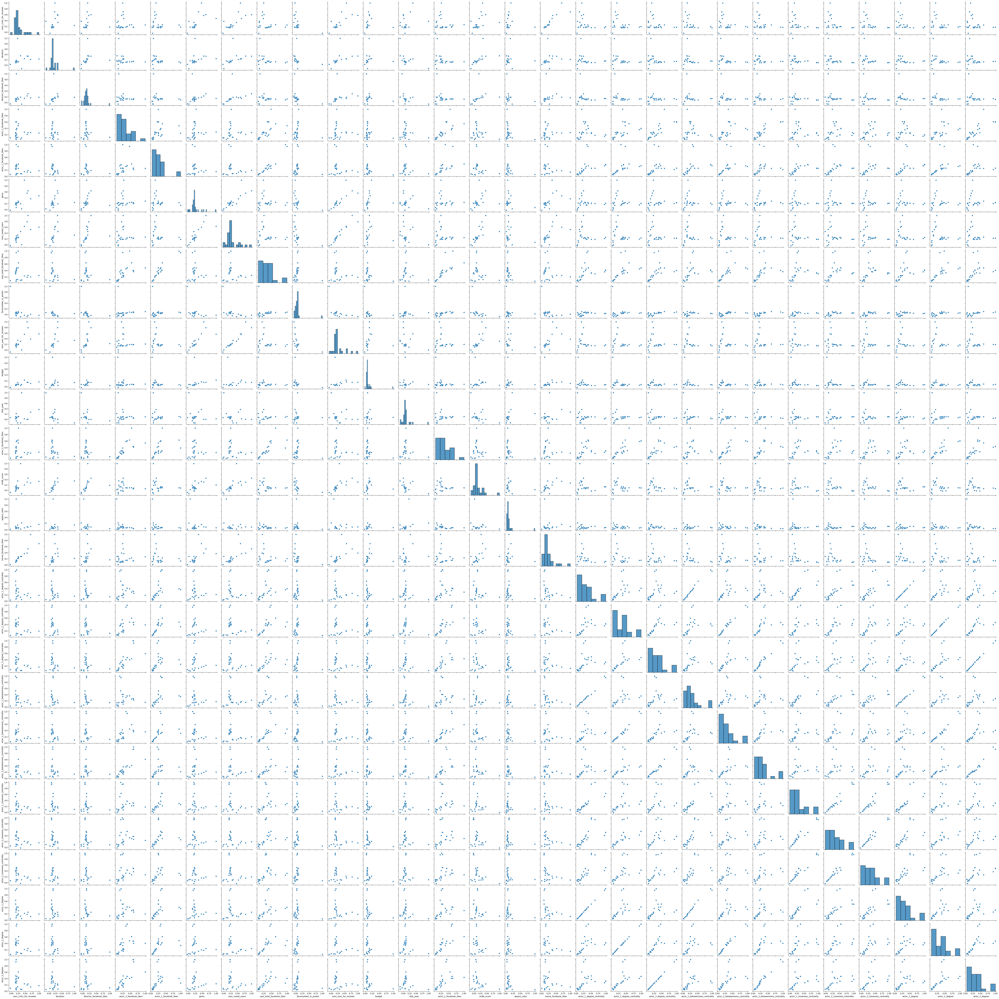

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

new_data = pd.read_csv("dataset/modelled_data.csv")
sns.pairplot(new_data.corr())
plt.show()

C:\Users\shrid\AppData\Local\Temp\ipykernel_12788\3313725667.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(new_data.corr(), annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})  # Increase the annotation font size


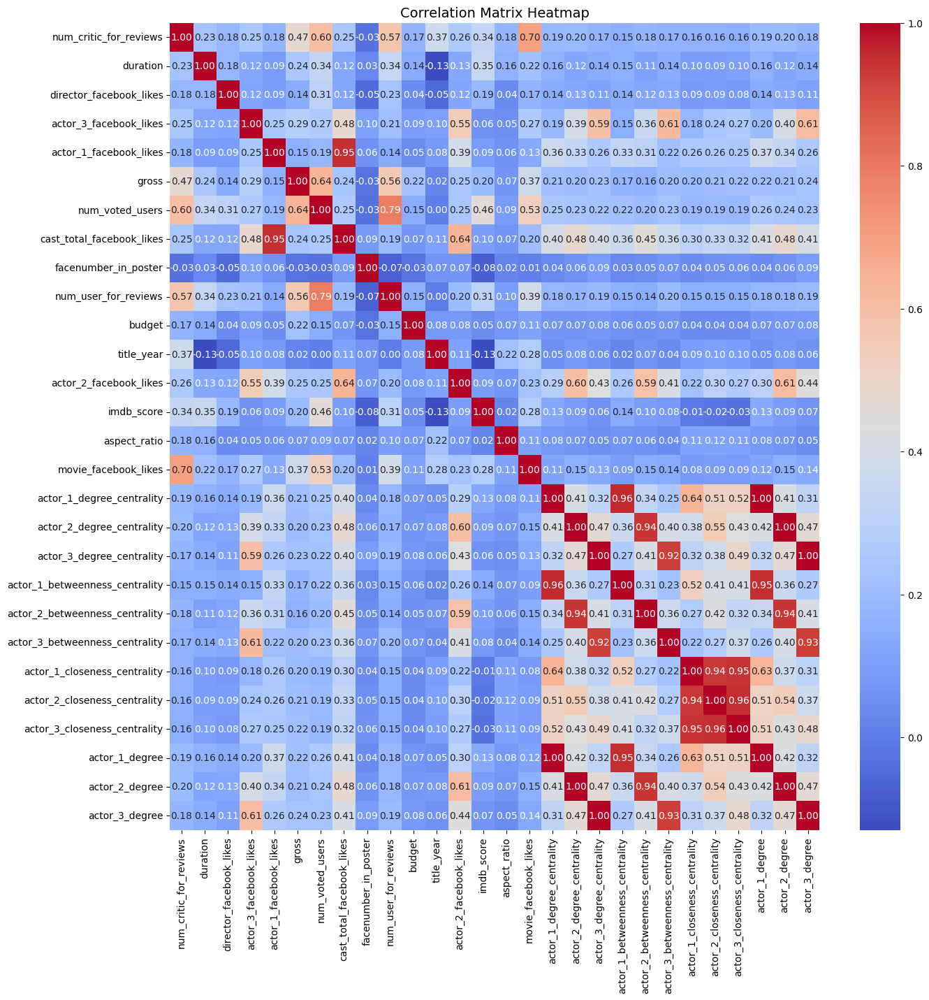

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 15))  # Increase the figure size
sns.heatmap(new_data.corr(), annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})  # Increase the annotation font size
plt.title('Correlation Matrix Heatmap', fontsize=14)  # Set the title font size
plt.show()

C:\Users\shrid\AppData\Local\Temp\ipykernel_12788\1484589291.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(sm_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")


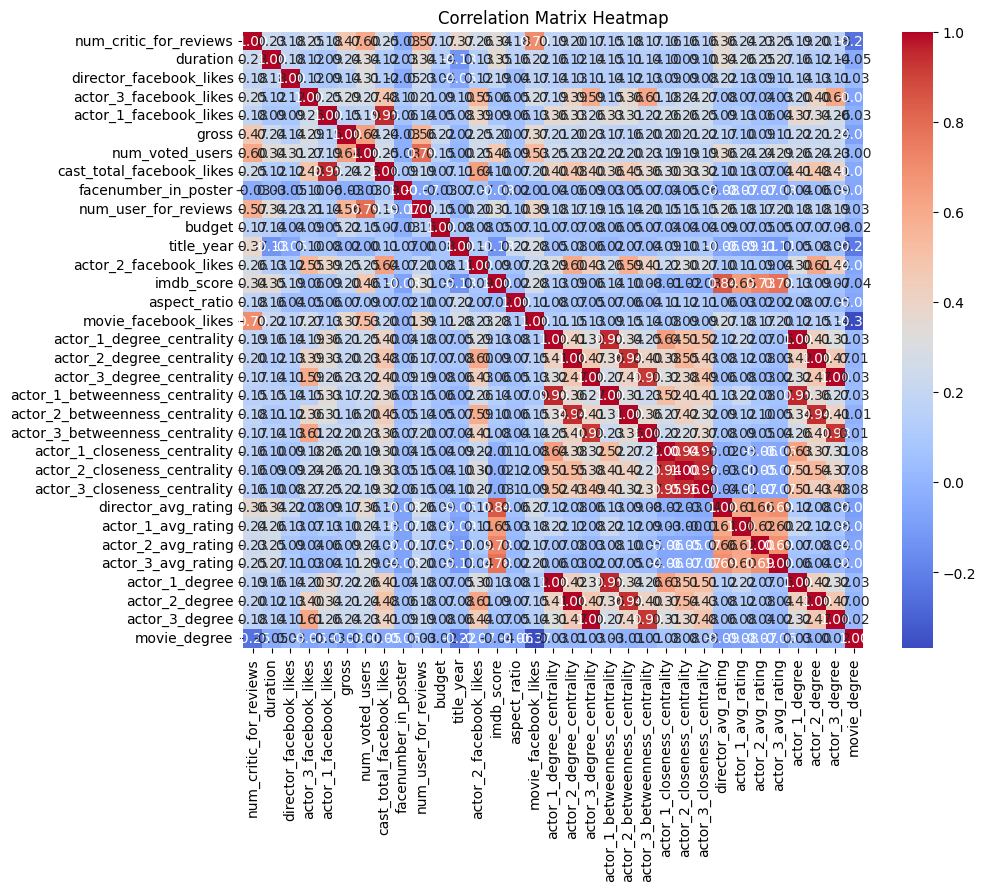

In [21]:
plt.figure(figsize=(10, 8))
sns.heatmap(sm_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

In [22]:
sns.pairplot(sm_data.corr())
plt.show()

C:\Users\shrid\AppData\Local\Temp\ipykernel_12788\2118843727.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.pairplot(sm_data.corr())


In [19]:
sm_data.to_csv("modelled_data.csv", index=False)